In [1]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import celltypist

In [2]:
import session_info
session_info.show()

In [3]:
sc.settings.set_figure_params(dpi=80)

# Read in adata

In [4]:
objects_dir = '/home/kk837/rds/rds-teichlab-C9woKbOCf2Y/kk837/Foetal/anndata_objects/Xenium'
path_adata = f'{objects_dir}/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_filtered_raw.h5ad'
adata = sc.read_h5ad(path_adata)
adata

AnnData object with n_obs × n_vars = 362277 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'pca_harmony_leiden_0.2', 'pca_harmony_leiden_0.3', 'pca_harmony_leiden_0.4', 'pca_harmony_leiden_0.5', 'pca_harmony_leiden_0.8', 'pca_harmony_leiden_1.0', 'pca_harmony_leiden_1.5', 'pca_harmony_leiden_2.0', 'pca_harmony_leiden_

In [5]:
os.getcwd()

'/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/Foetal/Xenium/5K/C194_Hst45/CamU_RevisionOct2025'

In [6]:
adata.X.data[:5]

array([5., 1., 1., 2., 2.], dtype=float32)

# Plot leiden clusters

In [7]:
latent_space = 'pca_harmony'
leiden_keys=[]
for res in [0.2,0.3,0.4,0.5,0.8,1.0,1.5,2.0,3.0]:
    leiden_key = f"leiden_{res}"
    key_added=f"{latent_space}_{leiden_key}"
    leiden_keys.append(key_added)

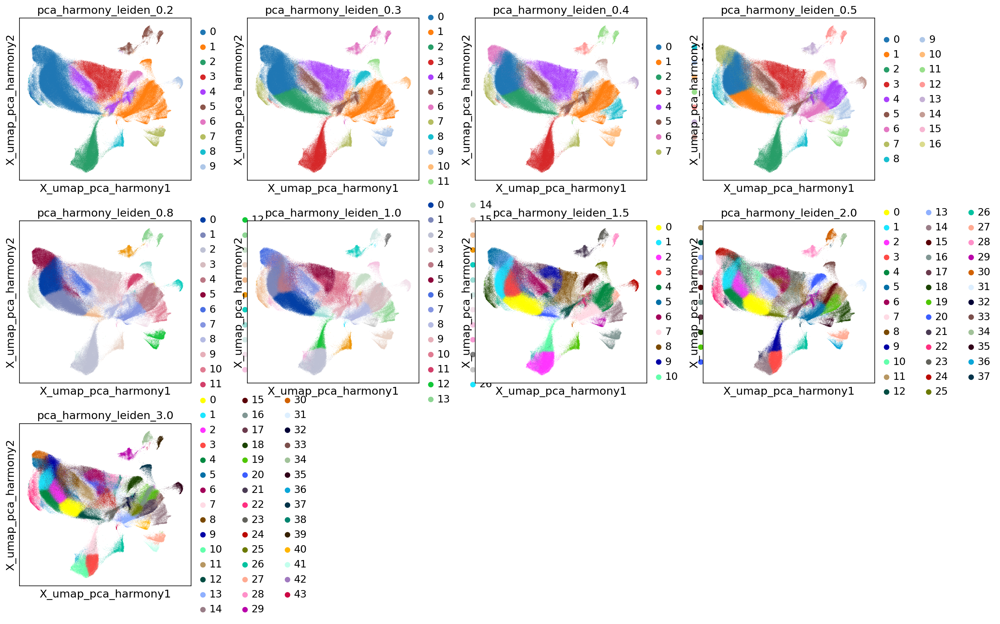

In [8]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                    color=leiden_keys,
                   ncols=4
                   )

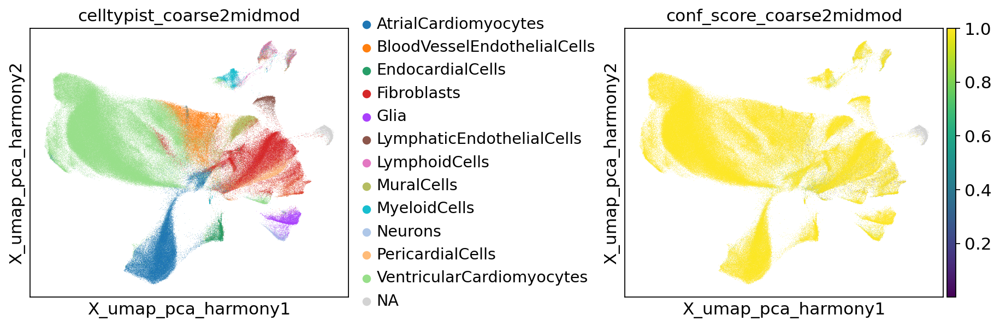

In [9]:
# plot celltypist prediction, for reference
sc.pl.embedding(adata,
                    basis=f"X_umap_{latent_space}",
                    color=['celltypist_coarse2midmod','conf_score_coarse2midmod'],
                   ncols=4,wspace=0.7
                   )

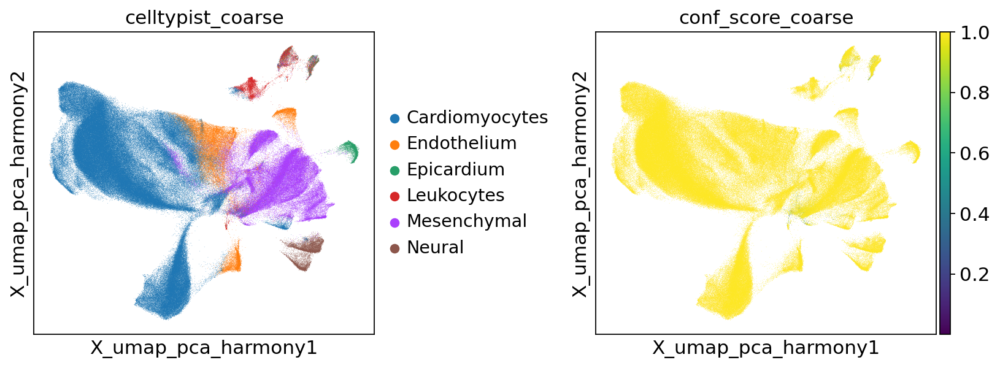

In [10]:
sc.pl.embedding(adata,
                    basis=f"X_umap_{latent_space}",
                    color=['celltypist_coarse','conf_score_coarse'],
                   ncols=4,wspace=0.5
                   )

# Marker expression

In [11]:
adata_lognorm = adata.copy()

sc.pp.filter_genes(adata_lognorm, min_cells=3)
print(adata_lognorm.shape)

sc.pp.normalize_total(adata_lognorm, target_sum=1e4)
sc.pp.log1p(adata_lognorm)
print(adata_lognorm.X.data[:5])

(362277, 5001)
[4.2093534 2.6576407 2.6576407 3.3151019 3.3151019]


In [12]:
# select leiden resolution
resolution_sel = '1.0'
leiden_key_sel = f'pca_harmony_leiden_{resolution_sel}'

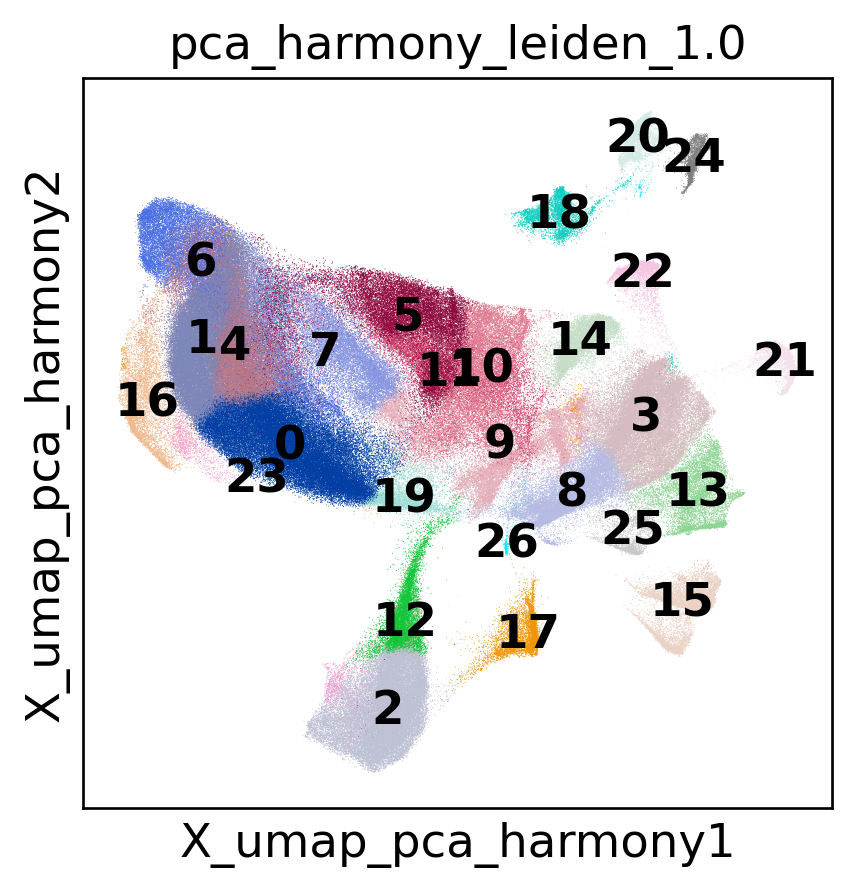

In [13]:
sc.settings.set_figure_params(dpi=120)
sc.pl.embedding(adata,
                    basis=f"X_umap_{latent_space}",
                    color=leiden_key_sel,
                   legend_loc='on data'
                   )
sc.settings.set_figure_params(dpi=80)

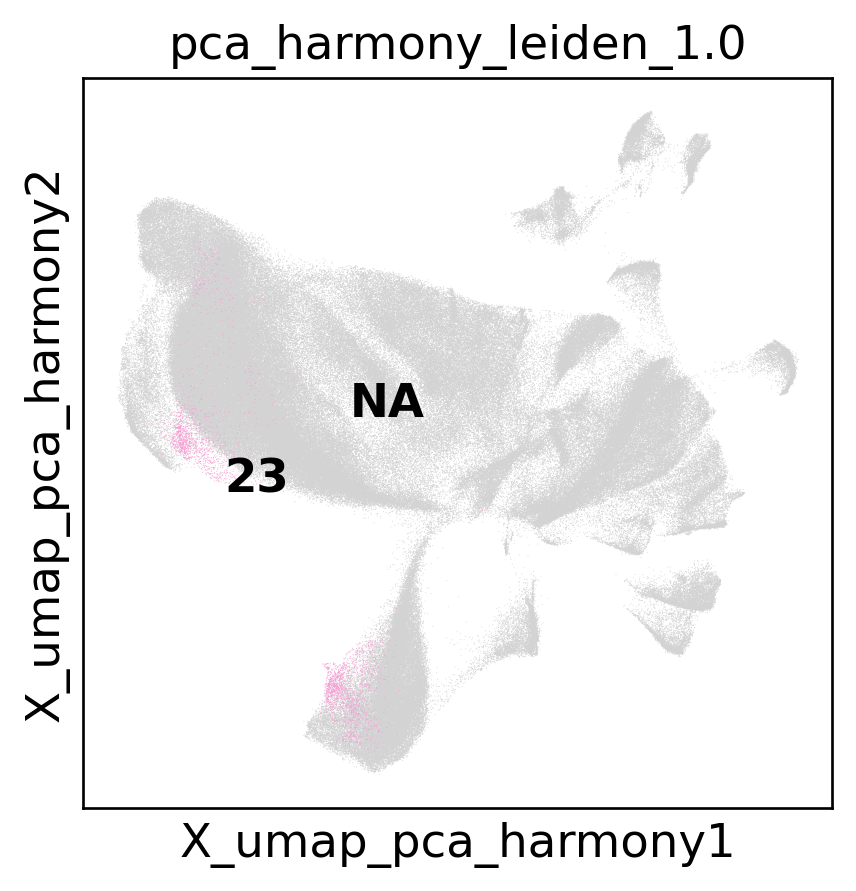

In [14]:
sc.settings.set_figure_params(dpi=120)
sc.pl.embedding(adata,
                    basis=f"X_umap_{latent_space}",
                    color=leiden_key_sel, groups=['23'],
                   legend_loc='on data'
                   )
sc.settings.set_figure_params(dpi=80)

categories: 0, 1, 2, etc.
var_group_labels: CM, vCM, aCM, etc.


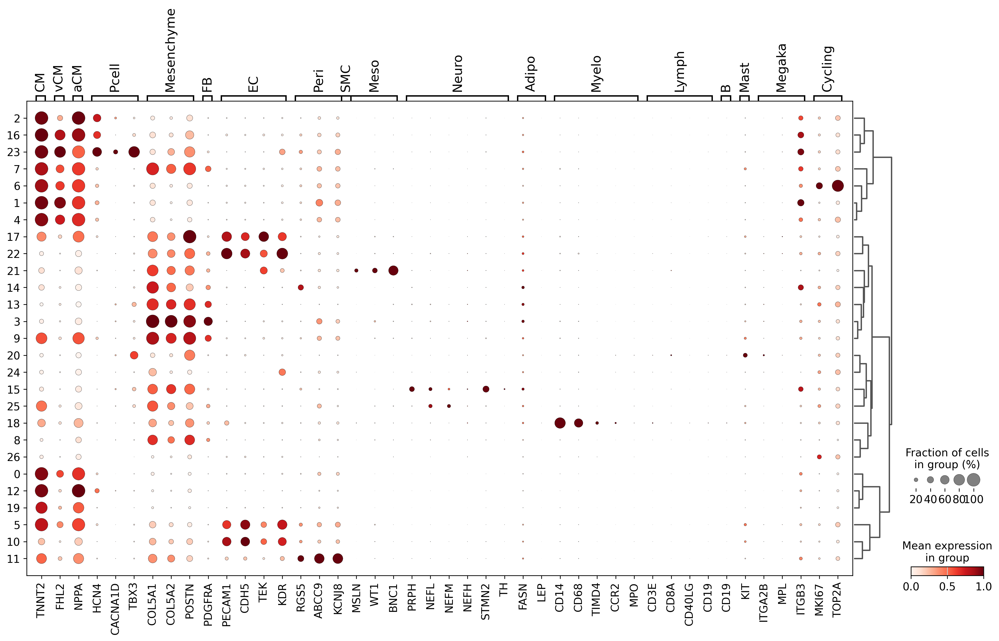

In [20]:
markers = {
    'CM': ['TTN', 'TNNT2','MYH6'],
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'Mesenchyme':['COL5A1','COL5A2','POSTN'], # markers in the Xenium5000 panel
    'FB': ['DCN', 'GCN', 'PDGFRA','COL1A1','COL1A2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','RGCC', 'FABP5','TEK','KDR','LYVE1','CCL21'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3','PRPH', 'NEFL', 'NEFM', 'NEFH', 'STMN2', 'SST', 'SLC10A4', 'SLC18A3', 'TH', 'NPY'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4','CCR2','MPO'],
    'Lymph': ['CD3E','CD3D','CD8A','IL7R', 'CD40LG','CD19','SDC1','IGHG1','IGHA1'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
    'Megaka':['ITGA2B','MPL','ITGB3', 'TUBB1', 'PPBP'],
    'Cycling':['MKI67','TOP2A'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata_lognorm.var_names]

sc.tl.dendrogram(adata_lognorm, groupby=leiden_key_sel)
sc.pl.dotplot(adata_lognorm,
              markers, 
              groupby=leiden_key_sel,
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

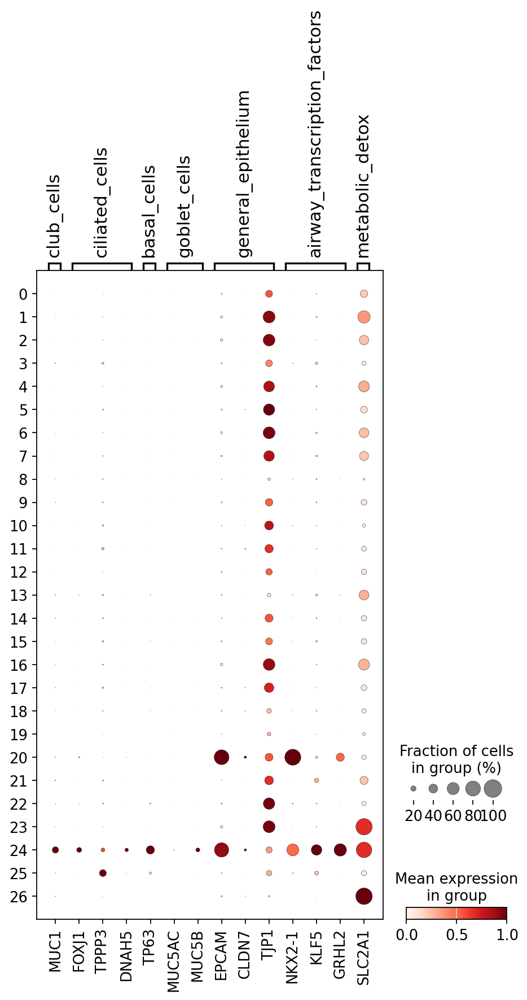

In [16]:
airway_markers = {
    "club_cells": [
        "SCGB1A1", "SCGB3A2", "AGR2", "SPDEF", "KRT8", "KRT18", "MUC1"
    ],
    "ciliated_cells": [
        "FOXJ1", "TPPP3", "DNAH5"
    ],
    "basal_cells": [
        "KRT5", "KRT14", "TP63"
    ],
    "goblet_cells": [
        "MUC5AC", "MUC5B", "SPDEF", "AGR2"
    ],
    "general_epithelium": [
        "EPCAM", "KRT8", "KRT18", "KRT19", "CLDN3", "CLDN4", "CLDN7", "TJP1"
    ],
    "airway_transcription_factors": [
        "NKX2-1", "KLF5", "GRHL2"
    ],
    "metabolic_detox": [
        "GSTP1", "SLC2A1"
    ]
}


for k, v in airway_markers.items():
    airway_markers[k] = [x for x in v if x in adata_lognorm.var_names]

sc.pl.dotplot(adata_lognorm, 
              airway_markers, 
              groupby=leiden_key_sel,
              dendrogram=False,
              standard_scale="var",
              color_map="Reds",
             # swap_axes=True
             )

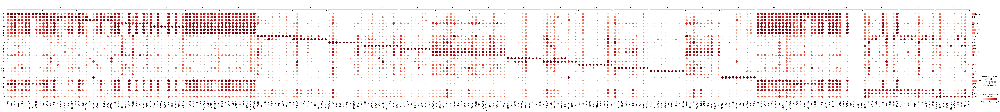

In [17]:
# DEG analysis
adata_lognorm.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata_lognorm,groupby=leiden_key_sel)
sc.tl.dendrogram(adata_lognorm, groupby=leiden_key_sel)
dp=sc.pl.rank_genes_groups_dotplot(adata_lognorm, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

# QC metrices

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

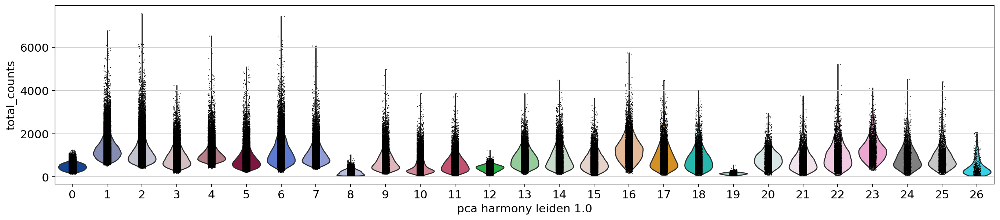

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

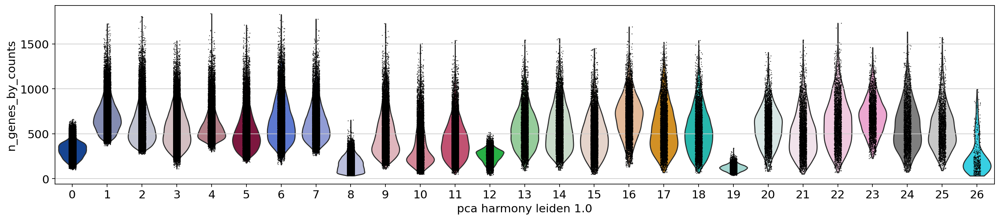

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings 

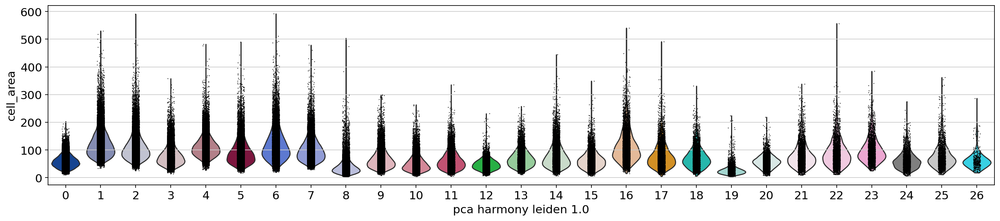

In [18]:
plt.rcParams['figure.figsize'] = 16,4
sc.pl.violin(adata,keys=['total_counts'],groupby=leiden_key_sel)
sc.pl.violin(adata,keys=['n_genes_by_counts'],groupby=leiden_key_sel)
sc.pl.violin(adata,keys=['cell_area'],groupby=leiden_key_sel)

sc.settings.set_figure_params(dpi=120)

In [19]:
df = adata.obs[[leiden_key_sel,'total_counts','n_genes_by_counts','cell_area']].groupby(leiden_key_sel).mean()
df.sort_values('n_genes_by_counts')[:20]

,total_counts,n_genes_by_counts,cell_area
pca_harmony_leiden_1.0,,,
19,153.869995,123.386402,27.755100
8,217.389740,171.385339,41.740290
26,451.238220,244.035377,62.550887
12,410.238953,256.686711,48.237269
0,486.308044,321.340417,59.297288
10,526.763611,359.465702,53.752764
11,658.386169,439.950430,63.594399
15,743.640320,488.988160,64.038657
9,803.685913,503.833881,68.568083


# Annotate

In [24]:
# Annotate and make a new column
adata_lognorm.obs['coarse_grain_pre'] = adata_lognorm.obs[leiden_key_sel].copy()
adata_lognorm.obs['coarse_grain_pre'] = adata_lognorm.obs['coarse_grain_pre'].astype('str')
adata_lognorm.obs.replace({'coarse_grain_pre': {
    '0': 'Cardiomyocytes', 
    '1': 'Cardiomyocytes', 
    '2': 'Cardiomyocytes', 
    '3': 'MesenchymalCells', 
    '4': 'Cardiomyocytes', 
    '5': 'unclassified_mixture', 
    '6': 'Cardiomyocytes', 
    '7': 'unclassified_mixture', 
    '8': 'MesenchymalCells', 
    '9': 'unclassified_mixture', 
    '10': 'unclassified_mixture', 
    '11': 'unclassified_mixture', 
    '12': 'Cardiomyocytes', 
    '13': 'MesenchymalCells', 
    '14': 'MesenchymalCells', 
    '15': 'NeuralCells_mixture', 
    '16': 'Cardiomyocytes', 
    '17': 'unclassified_mixture', 
    '18': 'MyeloidCells_mixture', 
    '19': 'Cardiomyocytes', 
    '20': 'EpithelialCells', 
    '21': 'EpicardialCells', 
    '22': 'EndothelialCells', 
    '23': 'Cardiomyocytes', 
    '24': 'EpithelialCells', 
    '25': 'unclassified_mixture', 
    '26': 'Erythrocytes', 
}}, inplace=True)
adata_lognorm.obs['coarse_grain_pre'].value_counts()

coarse_grain_pre
Cardiomyocytes          183226
unclassified_mixture     89888
MesenchymalCells         61655
NeuralCells_mixture       8277
EpithelialCells           6812
MyeloidCells_mixture      4731
EpicardialCells           3904
EndothelialCells          3360
Erythrocytes               424
Name: count, dtype: int64

... storing 'coarse_grain_pre' as categorical


(362277, 5001)
(362277, 5001)


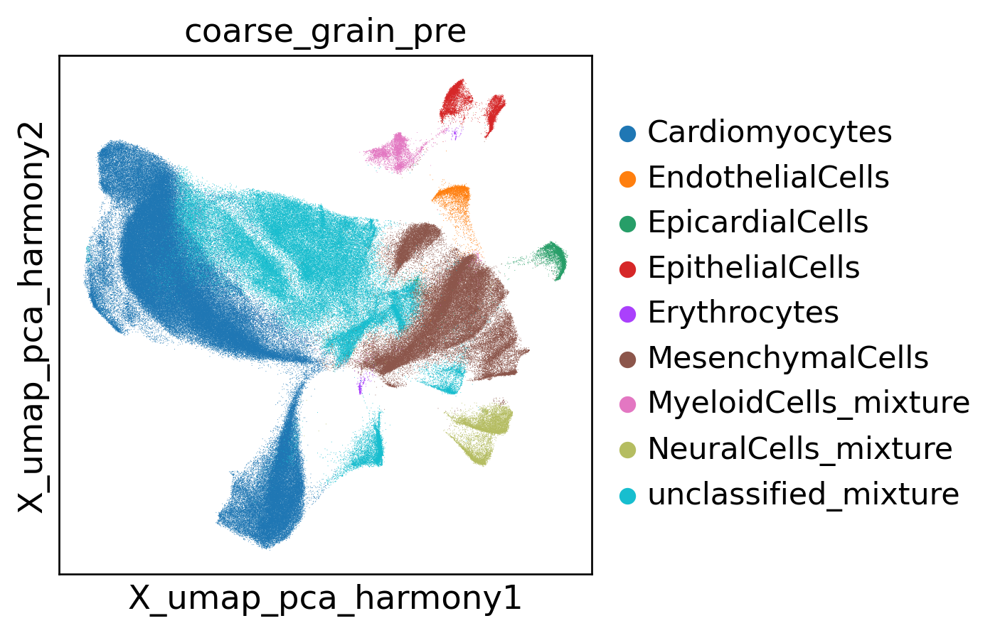

In [25]:
# Add to the raw adata
print(adata.shape)
print(adata_lognorm.shape)
adata.obs['coarse_grain_pre'] = adata_lognorm.obs['coarse_grain_pre'].reindex(adata.obs_names)

# plot celltypist prediction, for reference
sc.pl.embedding(adata,
                    basis=f"X_umap_{latent_space}",
                    color=['coarse_grain_pre'],
                   ncols=4,wspace=0.7
                   )

# Save

In [26]:
adata.write(path_adata)
path_adata

'/home/kk837/rds/rds-teichlab-C9woKbOCf2Y/kk837/Foetal/anndata_objects/Xenium/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_filtered_raw.h5ad'